# Exploratory Data Analysis (EDA) Notebook

## Introduction

With the data cleaning process complete, we now move on to **Exploratory Data Analysis (EDA)**. In this phase, we will explore the characteristics of our dataset to uncover patterns, relationships, and insights that will inform our modeling approach. EDA will help us understand the distribution of data, identify potential issues, and derive key insights that are crucial for building effective machine learning models.

### Project Goal

The ultimate goal of this project is to build a portfolio of stocks that can beat the S&P 500 index. Using machine learning models, we aim to select stocks with the highest probability of outperforming the market based on financial indicators and historical data. By ensuring our dataset is clean and well-prepared, we will lay a solid foundation for accurate model training and testing, driving us closer to this goal.

### Key Steps in EDA

1. **Descriptive Statistics**: Summarize the central tendency, dispersion, and shape of the dataset’s distribution. We will calculate key metrics like mean, median, and standard deviation for the numerical features.

2. **Data Visualization**: Visualize the distribution of variables and relationships between features using various plots (histograms, box plots, scatter plots, heatmaps, etc.). This will help us identify trends, correlations, and outliers.

3. **Correlation Analysis**: Explore the relationships between features to identify highly correlated variables. These insights will guide feature selection and help avoid multicollinearity in modeling.

4. **Outlier Detection**: Detect and analyze outliers that could skew the results of our models. We will decide whether to remove, transform, or keep these outliers.
   
5. **Next Steps.**

By conducting a thorough EDA, we will gain valuable insights into the data, which will inform our decisions during model development and help us achieve the project’s goal of building a robust, market-beating stock portfolio.


### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

### Loading Datasets

In [2]:
# Load all datasets from 2014 to 2018
data_2014 = pd.read_csv('data/cleaned_data/2014_Financial_Data_Cleaned.csv')
data_2015 = pd.read_csv('data/cleaned_data/2015_Financial_Data_Cleaned.csv')
data_2016 = pd.read_csv('data/cleaned_data/2016_Financial_Data_Cleaned.csv')
data_2017 = pd.read_csv('data/cleaned_data/2017_Financial_Data_Cleaned.csv')
data_2018 = pd.read_csv('data/cleaned_data/2018_Financial_Data_Cleaned.csv')
# Data 2018 is already loaded as data_2018

full_df = {'2014': data_2014,
           '2015': data_2015,
           '2016': data_2016,
           '2017': data_2017,
           '2018': data_2018
          }

# Print the head of each year
for year, df in full_df.items():
    print(f"Head of {year}:")
    print(df.head(), "\n")

Head of 2014:
  Symbol       Revenue  Revenue Growth  Cost of Revenue  Gross Profit  \
0     PG  7.440100e+10         -0.0713     3.903000e+10  3.537100e+10   
1   VIPS  3.734148e+09          1.1737     2.805625e+09  9.285226e+08   
2     KR  9.837500e+10          0.0182     7.813800e+10  2.023700e+10   
3    RAD  2.552641e+10          0.0053     1.820268e+10  7.323734e+09   
4    GIS  1.790960e+10          0.0076     1.153980e+10  6.369800e+09   

   R&D Expenses  SG&A Expense  Operating Expenses  Operating Income  \
0  0.000000e+00  2.146100e+10        2.146100e+10      1.391000e+10   
1  1.083303e+08  3.441414e+08        7.939267e+08      1.345959e+08   
2  0.000000e+00  1.519600e+10        1.751200e+10      2.725000e+09   
3  0.000000e+00  6.561162e+09        6.586482e+09      7.372520e+08   
4  0.000000e+00  3.474300e+09        3.412400e+09      2.957400e+09   

   Interest Expense  ...  Inventory Growth  Asset Growth  \
0      7.090000e+08  ...          -0.02170       0.03590   


## Descriptive Statistics

In this step, we will summarize the central tendency, dispersion, and shape of the dataset's distribution by calculating key metrics such as:

- **Mean**: The average value of the feature.
- **Median**: The middle value when the feature is ordered.
- **Standard Deviation**: The amount of variation or dispersion of the feature.
- **Minimum and Maximum Values**: The range of the data.

We will generate these statistics for each year's dataset, focusing on the numerical features to understand the overall distribution of values and identify potential patterns or anomalies in the data.


In [3]:
# Create a dataframe to display descriptive statistics for each year
for year, df in full_df.items():
    print(f"Descriptive statistics for {year}:")
    display(df.describe())
    print("\n")


Descriptive statistics for 2014:


,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,...,Receivables growth,Inventory Growth,Asset Growth,Book Value per Share Growth,Debt Growth,R&D Expense Growth,SG&A Expenses Growth,PRICE VAR [%],Class,Year
count,3.808000e+03,3808.000000,3.808000e+03,3.808000e+03,3.808000e+03,3.808000e+03,3.808000e+03,3.808000e+03,3.808000e+03,3.808000e+03,...,3808.000000,3808.000000,3808.000000,3808.000000,3808.000000,3808.000000,3808.000000,3.808000e+03,3808.000000,3808.0
mean,5.827043e+09,16.748177,3.643149e+09,2.178025e+09,9.189444e+07,9.203191e+08,1.433355e+09,6.832159e+08,9.962536e+07,5.693951e+08,...,4.343068,0.176830,2.258200,0.787850,1.314363,0.787487,0.377131,9.751560e+02,0.429097,2014.0
std,3.879526e+10,692.358187,3.011679e+10,1.152126e+10,6.297619e+08,4.785359e+09,7.289440e+09,3.791190e+09,6.939432e+08,2.777155e+09,...,154.919887,2.134307,89.036668,24.384187,17.990452,25.479232,4.552676,4.098461e+04,0.495012,0.0
min,-6.276160e+08,-1.773200,-5.455740e+08,-1.105000e+09,-1.500000e+05,0.000000e+00,-1.088448e+09,-6.786000e+09,-2.250000e+08,-8.878000e+09,...,-1.000000,-1.000000,-0.979600,-230.000000,-1.051000,-1.043700,-1.000000,-1.003972e+02,0.000000,2014.0
25%,5.773090e+07,0.000000,3.448978e+06,3.102975e+07,0.000000e+00,1.552950e+07,3.084837e+07,-9.887500e+05,0.000000e+00,-3.153786e+06,...,-0.039240,0.000000,-0.008800,-0.072425,-0.038450,0.000000,0.000000,-2.857143e+01,0.000000,2014.0
50%,4.331300e+08,0.065300,1.369595e+08,1.907405e+08,0.000000e+00,7.378600e+07,1.379415e+08,4.082500e+07,2.571000e+06,2.805100e+07,...,0.023600,0.000000,0.067900,0.041630,0.000000,0.000000,0.073400,-5.281842e+00,0.000000,2014.0
75%,2.380804e+09,0.195125,1.169804e+09,8.892004e+08,1.055375e+07,3.444658e+08,5.815000e+08,2.701745e+08,4.254100e+07,2.150808e+08,...,0.219825,0.070725,0.229350,0.150125,0.247325,0.028270,0.222425,1.331484e+01,1.000000,2014.0
max,1.824698e+12,42138.663900,1.537249e+12,4.621600e+11,1.153700e+10,1.856830e+11,3.056050e+11,1.565540e+11,3.152300e+10,8.720500e+10,...,9328.200000,76.625000,5468.426400,1360.125000,729.576600,1542.611000,225.690000,2.418601e+06,1.000000,2014.0




Descriptive statistics for 2015:


,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,...,Receivables growth,Inventory Growth,Asset Growth,Book Value per Share Growth,Debt Growth,R&D Expense Growth,SG&A Expenses Growth,PRICE VAR [%],Class,Year
count,4.120000e+03,4120.000000,4.120000e+03,4.120000e+03,4.120000e+03,4.120000e+03,4.120000e+03,4.120000e+03,4.120000e+03,4.120000e+03,...,4120.000000,4120.000000,4120.000000,4120.000000,4120.000000,4120.000000,4120.000000,4120.000000,4120.000000,4120.0
mean,4.947639e+09,0.282753,3.149722e+09,1.867869e+09,9.584601e+07,8.454743e+08,1.375099e+09,5.044574e+08,9.342445e+07,4.023883e+08,...,0.607053,0.136167,0.421434,11.010542,2.717355,0.290714,0.315501,103.077642,0.701699,2015.0
std,3.428290e+10,3.432753,2.773051e+10,8.341111e+09,6.565064e+08,3.461841e+09,5.169590e+09,2.762706e+09,5.207920e+08,2.401124e+09,...,6.451744,2.973049,4.031356,127.643735,87.174903,5.427094,5.572110,3756.530836,0.457568,0.0
min,-3.357020e+08,-1.064300,-2.665346e+09,-1.280800e+10,-4.179153e+06,0.000000e+00,-5.495512e+09,-1.933900e+10,-1.710954e+09,-1.910900e+10,...,-1.000000,-1.000000,-0.996400,-379.478300,-1.000000,-1.000000,-0.991200,-99.947830,0.000000,2015.0
25%,5.368675e+07,-0.045525,4.638298e+06,2.741342e+07,0.000000e+00,1.591843e+07,3.284961e+07,-5.918000e+06,0.000000e+00,-1.052528e+07,...,-0.091650,-0.012300,-0.045500,-0.115325,-0.050600,0.000000,-0.027500,-5.172844,0.000000,2015.0
50%,3.998074e+08,0.035350,1.330765e+08,1.752345e+08,0.000000e+00,7.470050e+07,1.450453e+08,2.969400e+07,2.937500e+06,1.838646e+07,...,0.000000,0.000000,0.037850,0.018050,0.000000,0.000000,0.057200,17.278935,1.000000,2015.0
75%,2.170945e+09,0.160900,1.144385e+09,8.167455e+08,1.228325e+07,3.595972e+08,6.281048e+08,2.313772e+08,4.450000e+07,1.664552e+08,...,0.175500,0.030000,0.176855,0.128700,0.205375,0.017125,0.191325,40.567983,1.000000,2015.0
max,1.886894e+12,189.817900,1.581527e+12,3.053670e+11,1.306700e+10,9.341800e+10,9.341800e+10,7.123000e+10,1.844600e+10,7.251500e+10,...,220.341000,170.427600,153.720000,7039.325900,5443.000000,297.736800,324.926800,212700.011623,1.000000,2015.0




Descriptive statistics for 2016:


,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,...,Receivables growth,Inventory Growth,Asset Growth,Book Value per Share Growth,Debt Growth,R&D Expense Growth,SG&A Expenses Growth,PRICE VAR [%],Class,Year
count,4.797000e+03,4797.000000,4.797000e+03,4.797000e+03,4.797000e+03,4.797000e+03,4.797000e+03,4.797000e+03,4.797000e+03,4.797000e+03,...,4797.000000,4797.000000,4797.000000,4797.000000,4797.000000,4797.000000,4797.000000,4.797000e+03,4797.000000,4797.0
mean,5.407936e+09,1.467669,3.309417e+09,1.923716e+09,1.027196e+08,9.687270e+08,1.784352e+09,5.689969e+08,1.055958e+08,4.398143e+08,...,0.747966,0.169081,0.586447,2.044529,2.952685,0.134240,0.272097,3.650260e+02,0.670836,2016.0
std,3.114931e+10,48.850778,2.526746e+10,7.583881e+09,6.873778e+08,3.457706e+09,5.060040e+09,2.449216e+09,4.193670e+08,2.085307e+09,...,19.995022,3.550055,13.035869,83.198043,49.943396,3.297285,3.136125,1.940149e+04,0.469959,0.0
min,-3.819270e+08,-12.769300,-2.639031e+09,-3.564190e+09,-8.610000e+07,-5.207792e+07,-9.357000e+08,-6.770000e+09,-1.107000e+09,-7.621000e+09,...,-1.000000,-1.000000,-1.000000,-3963.131200,-1.000000,-2.662200,-2.099000,-9.999941e+01,0.000000,2016.0
25%,6.181400e+07,-0.037300,6.857878e+06,3.225500e+07,0.000000e+00,1.847800e+07,3.848600e+07,-2.799000e+06,0.000000e+00,-6.699562e+06,...,-0.029600,-0.007400,-0.025300,-0.105500,-0.058900,0.000000,-0.012100,-6.730768e+00,0.000000,2016.0
50%,5.241630e+08,0.033900,2.053400e+08,2.316170e+08,0.000000e+00,9.860200e+07,1.840000e+08,4.700300e+07,6.147000e+06,2.804200e+07,...,0.025800,0.000000,0.051900,0.031800,0.000000,0.000000,0.057200,1.090686e+01,1.000000,2016.0
75%,3.704000e+09,0.158000,1.911230e+09,9.971660e+08,2.010300e+07,4.537680e+08,1.005935e+09,2.883360e+08,6.972300e+07,2.070170e+08,...,0.221500,0.038293,0.149800,0.147200,0.177300,0.016093,0.179753,3.155634e+01,1.000000,2016.0
max,1.822805e+12,3234.456800,1.548384e+12,2.744210e+11,1.608500e+10,9.704100e+10,9.704100e+10,6.002400e+10,1.517600e+10,6.137200e+10,...,1340.695700,217.041700,636.156900,3710.666700,2893.736800,224.818200,122.895700,1.321281e+06,1.000000,2016.0




Descriptive statistics for 2017:


,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,...,Receivables growth,Inventory Growth,Asset Growth,Book Value per Share Growth,Debt Growth,R&D Expense Growth,SG&A Expenses Growth,PRICE VAR [%],Class,Year
count,4.960000e+03,4960.000000,4.960000e+03,4.960000e+03,4.960000e+03,4.960000e+03,4.960000e+03,4.960000e+03,4.960000e+03,4.960000e+03,...,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.0
mean,6.032709e+09,0.899057,3.136312e+09,2.228788e+09,1.050592e+08,8.800798e+08,1.352505e+09,6.396391e+08,9.780714e+07,4.810606e+08,...,14.280965,0.114098,1.133818,0.234799,1.314362,0.351148,0.633399,-4.461547,0.276210,2017.0
std,3.012499e+10,17.542921,2.439145e+10,7.661816e+09,7.446404e+08,3.344763e+09,4.977082e+09,2.649287e+09,3.937918e+08,2.232010e+09,...,353.167333,0.990620,30.464254,4.167366,30.833692,12.231285,29.053119,561.802215,0.447167,0.0
min,-3.004500e+07,-6.872700,-2.986888e+09,-8.138230e+08,-1.098000e+08,-1.043667e+08,-1.088000e+09,-1.868300e+10,-1.932443e+08,-1.819800e+10,...,-1.000000,-1.000000,-1.000000,-221.000000,-1.000000,-1.218100,-2.369900,-99.999115,0.000000,2017.0
25%,7.103675e+07,0.007875,9.061250e+06,3.883155e+07,0.000000e+00,2.084325e+07,4.149950e+07,-1.407000e+06,1.475000e+04,-5.158579e+06,...,0.000000,0.000000,0.006300,-0.034050,-0.042222,0.000000,0.002175,-33.388915,0.000000,2017.0
50%,5.879490e+08,0.087603,2.313350e+08,2.634425e+08,0.000000e+00,1.083754e+08,1.999895e+08,5.528117e+07,8.367344e+06,3.918867e+07,...,0.082100,0.000000,0.083613,0.077457,0.002100,0.000000,0.070017,-13.336397,0.000000,2017.0
75%,4.001464e+09,0.224900,1.387931e+09,1.474271e+09,1.836175e+07,4.605000e+08,6.741238e+08,3.804000e+08,5.947430e+07,2.328505e+08,...,0.252225,0.105910,0.191325,0.210128,0.157475,0.024542,0.169525,2.124593,1.000000,2017.0
max,1.695864e+12,825.959800,1.465577e+12,2.302870e+11,2.262000e+10,1.018530e+11,1.018530e+11,6.513565e+10,1.340100e+10,6.408900e+10,...,18499.000000,43.553400,2014.273300,84.127700,1981.061600,837.000000,2042.000000,39219.999109,1.000000,2017.0




Descriptive statistics for 2018:


,Revenue,Revenue Growth,Cost of Revenue,Gross Profit,R&D Expenses,SG&A Expense,Operating Expenses,Operating Income,Interest Expense,Earnings before Tax,...,Receivables growth,Inventory Growth,Asset Growth,Book Value per Share Growth,Debt Growth,R&D Expense Growth,SG&A Expenses Growth,PRICE VAR [%],Class,Year
count,4.392000e+03,4392.000000,4.392000e+03,4.392000e+03,4.392000e+03,4.392000e+03,4.392000e+03,4.392000e+03,4.392000e+03,4.392000e+03,...,4392.000000,4392.000000,4392.000000,4392.000000,4392.000000,4392.000000,4392.000000,4392.000000,4392.000000,4392.0
mean,5.087994e+09,3.351450,3.176599e+09,2.030147e+09,1.238296e+08,9.310021e+08,1.479099e+09,6.500797e+08,1.013972e+08,5.548492e+08,...,49.856884,0.181742,1.454883,0.266086,9.349883,0.090533,0.154441,20.803948,0.693534,2018.0
std,2.039702e+10,192.386465,1.485848e+10,7.637176e+09,9.174651e+08,3.663490e+09,5.505919e+09,2.957917e+09,3.737509e+08,2.620641e+09,...,2344.148182,4.572012,34.542348,5.448648,352.621899,0.801464,0.821488,82.622147,0.461078,0.0
min,-6.894100e+07,-3.461500,-2.669055e+09,-1.818220e+09,-1.042000e+08,-1.401594e+08,-4.280000e+09,-1.455700e+10,-1.408252e+09,-2.177200e+10,...,-1.000000,-1.000000,-0.999100,-32.258100,-1.000000,-1.000000,-1.000000,-99.864779,0.000000,2018.0
25%,6.468400e+07,0.000000,4.879500e+06,3.612559e+07,0.000000e+00,1.992250e+07,4.090575e+07,-5.273242e+06,0.000000e+00,-9.576750e+06,...,-0.044400,0.000000,-0.035000,-0.099025,-0.075725,0.000000,-0.001500,-7.477173,0.000000,2018.0
50%,4.948720e+08,0.076600,1.736660e+08,2.182450e+08,0.000000e+00,9.357050e+07,1.806253e+08,4.188224e+07,6.145766e+06,2.697700e+07,...,0.015200,0.000000,0.035950,0.026550,0.000000,0.000000,0.067200,17.639393,1.000000,2018.0
75%,2.449234e+09,0.189200,1.333575e+09,9.736448e+08,1.597675e+07,4.316370e+08,7.014795e+08,2.861580e+08,6.053650e+07,2.229352e+08,...,0.192025,0.083600,0.156150,0.137325,0.126300,0.020725,0.167500,39.625879,1.000000,2018.0
max,5.003430e+11,12739.000000,3.733960e+11,1.269470e+11,2.883700e+10,1.065100e+11,1.065100e+11,7.089800e+10,9.168000e+09,7.290300e+10,...,153332.333300,293.473000,1184.993800,313.395800,17646.823500,36.898100,43.718800,3756.716345,1.000000,2018.0


##### There are unusual numbers, such as the max Revenue Growth, which is extremely high and seems suspicious. We will investigate further using some visualization techniques.

## 2. Data Visualization

In this step, we will use various visualization techniques to explore the distribution of variables and the relationships between different features. Visualizing the data helps us uncover patterns, trends, correlations, and potential outliers that might not be immediately apparent from summary statistics alone.

We will use the following visualizations:

- **Histograms**: To observe the distribution of individual numerical features.
- **Box Plots**: To detect outliers and understand the spread of the data.
- **Scatter Plots**: To explore relationships between pairs of numerical features.
- **Heatmaps**: To visualize correlations between features.

By visually inspecting the data, we will gain a deeper understanding of its structure and behavior, which will be essential for guiding feature engineering and model building.


### Histograms and boxplots

In [4]:
def plot_financial_data(df, num_bins=50, outlier_cap=0.25):
    # Select only numeric columns
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    
    for column in numeric_cols:
        # Handling outliers
        lower_bound, upper_bound = df[column].quantile([outlier_cap, 1-outlier_cap])
        df_filtered = df[(df[column] > lower_bound) & (df[column] < upper_bound)]

        # Plotting
        plt.figure(figsize=(12, 6))
        
        # Histogram
        plt.subplot(1, 2, 1)
        sns.histplot(df_filtered[column], bins=num_bins, kde=False, color='blue')
        plt.title(f'Histogram of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        
        # Boxplot
        plt.subplot(1, 2, 2)
        sns.boxplot(x=df_filtered[column])
        plt.title(f'Boxplot of {column}')
        plt.xlabel(column)
        
        plt.tight_layout()
        plt.show()
        plt.close()  # Helps free up memory by closing the plot


In [ ]:
plot_financial_data(full_df['2014'])

In [ ]:
plot_financial_data(full_df['2015'])

In [ ]:
plot_financial_data(full_df['2016'])

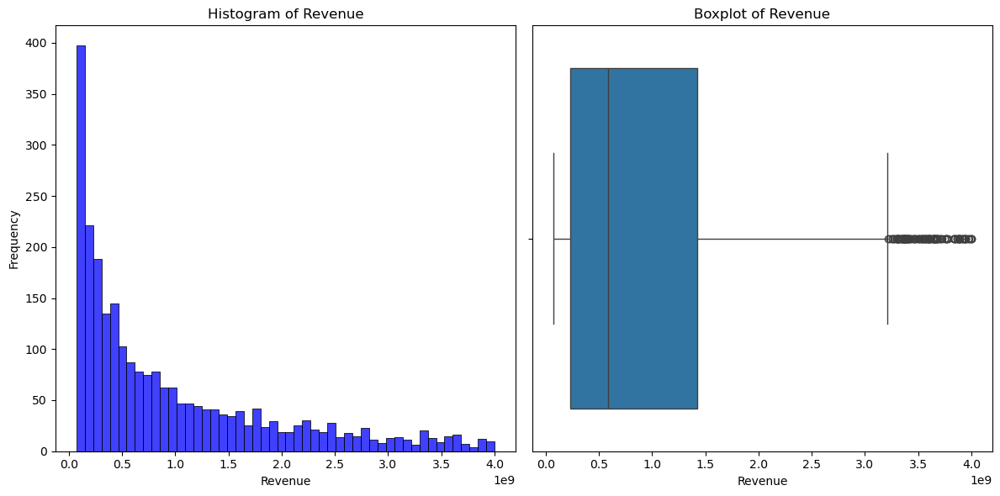

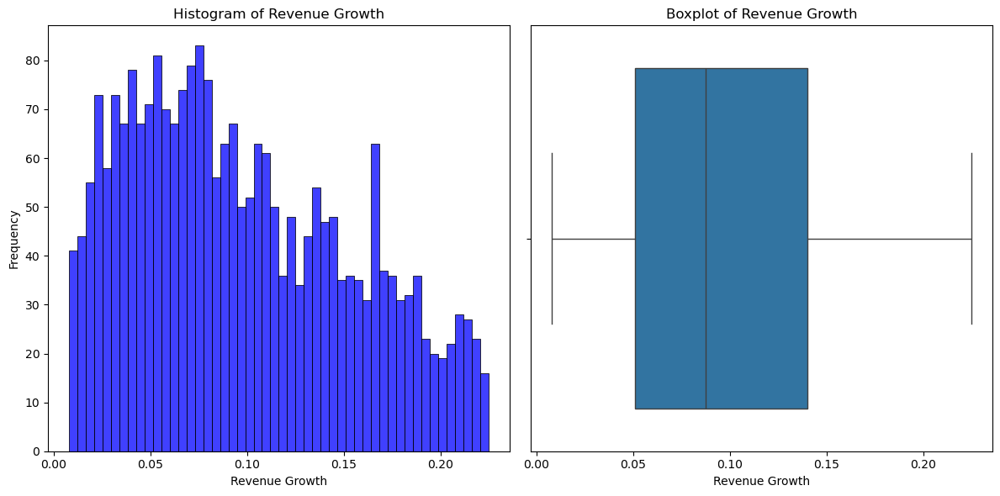

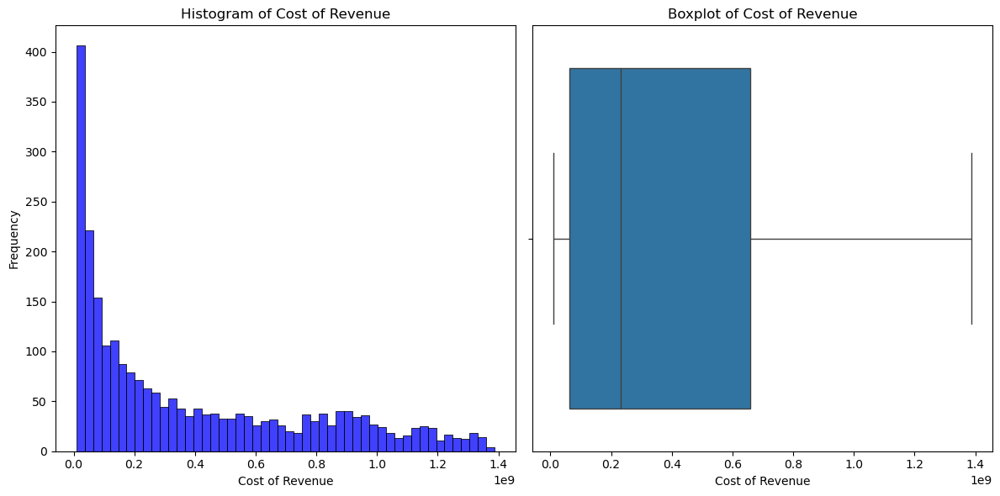

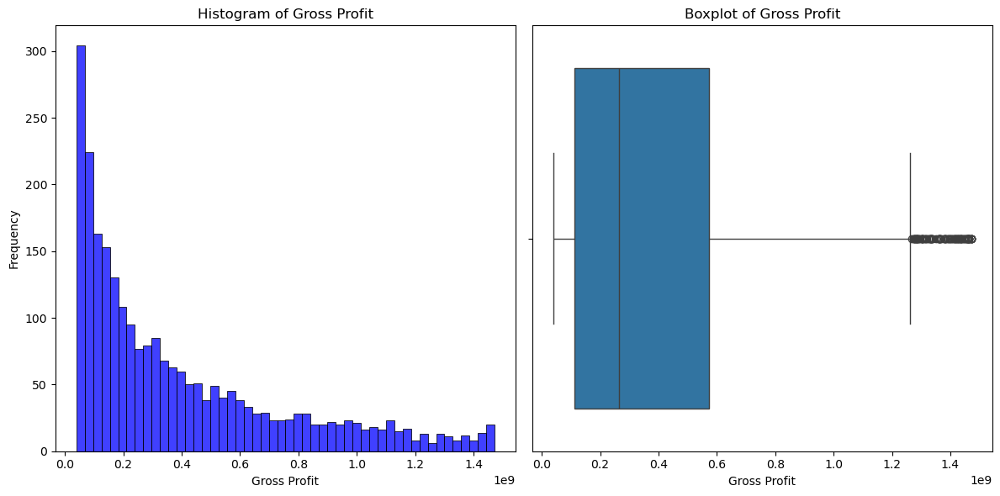

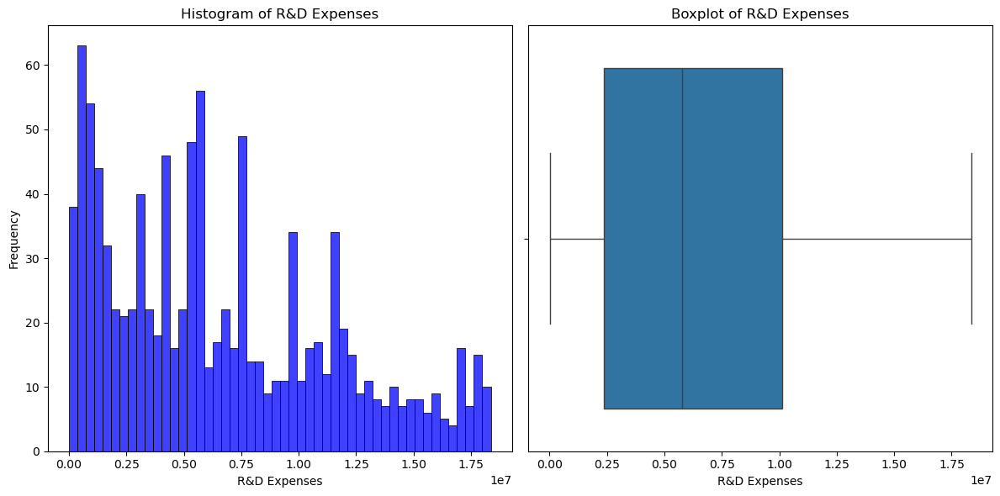

...

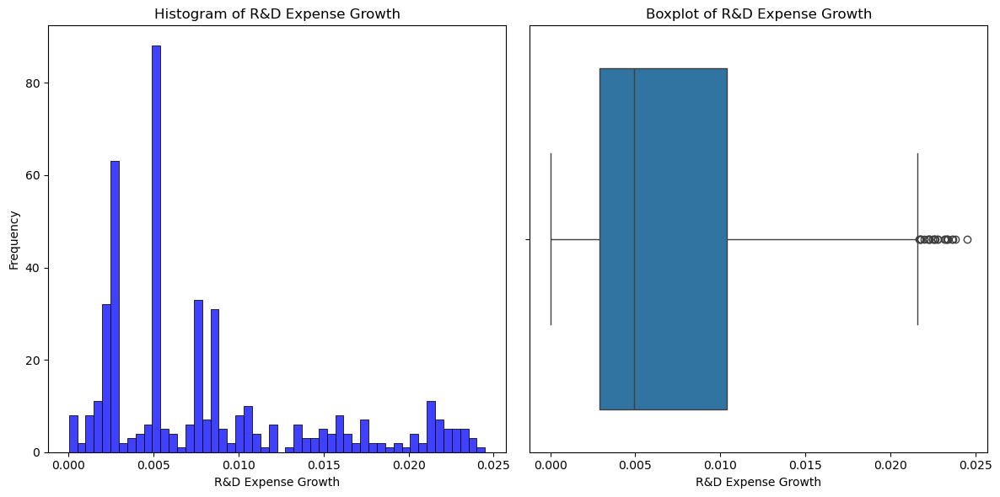

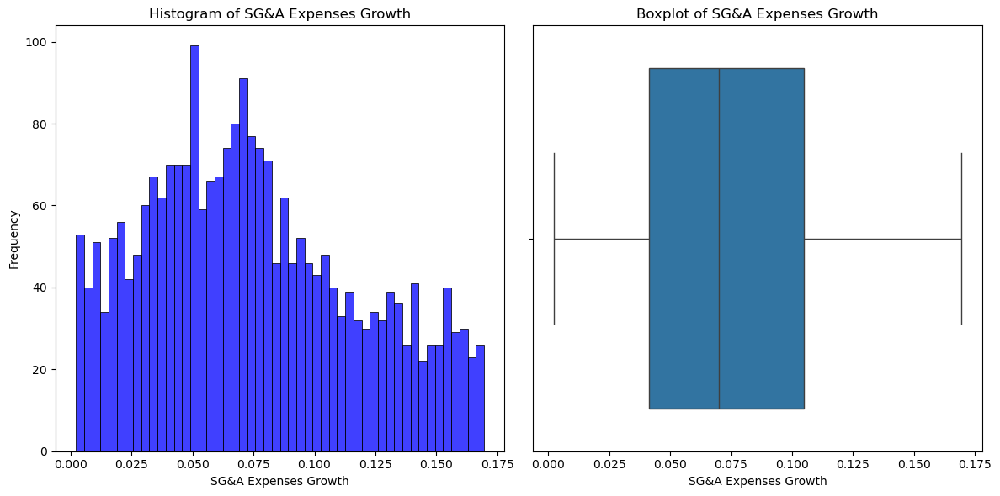

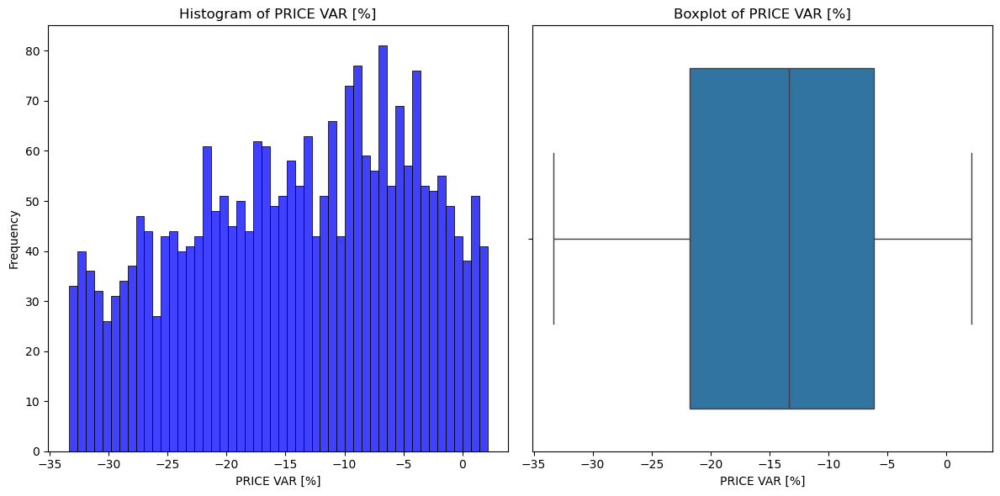

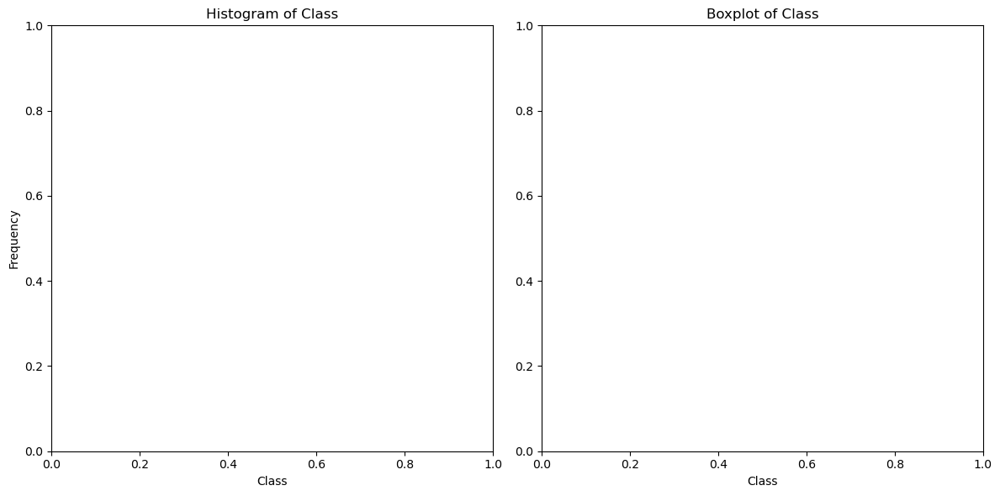

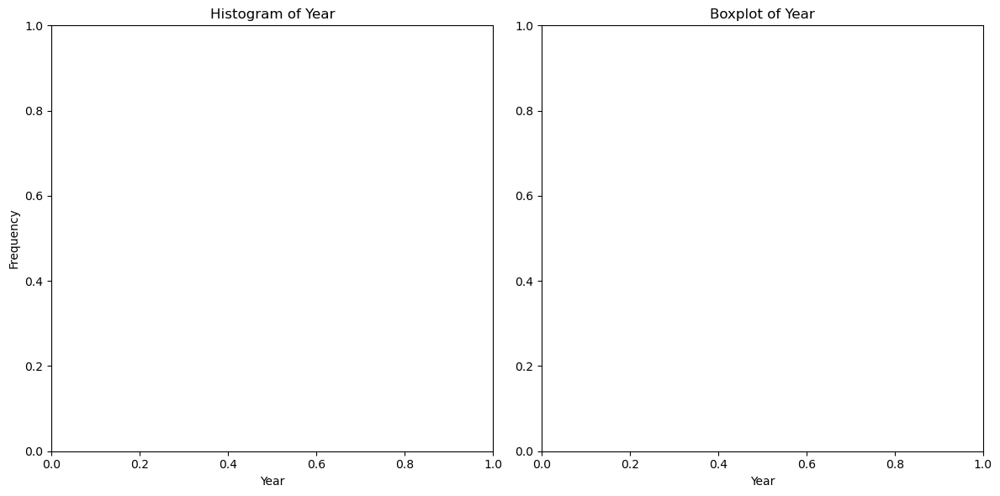

In [8]:
plot_financial_data(full_df['2017'])

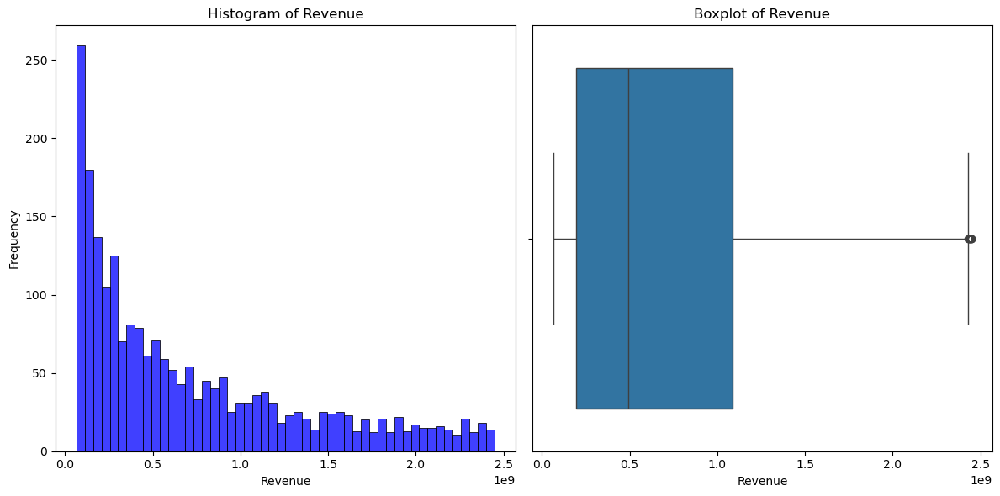

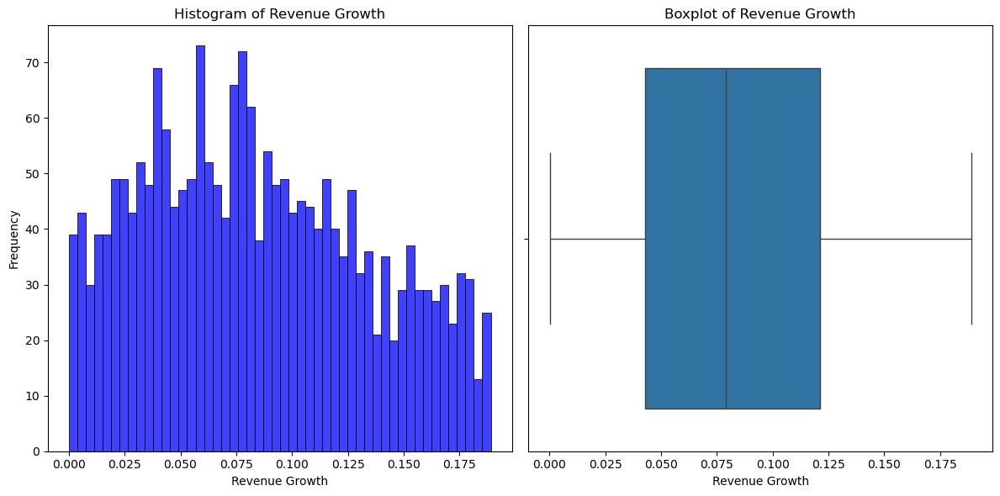

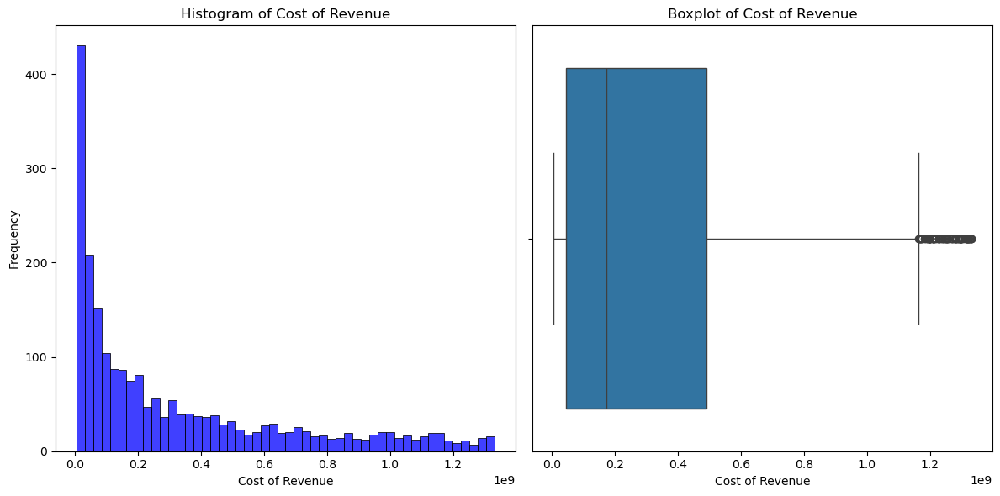

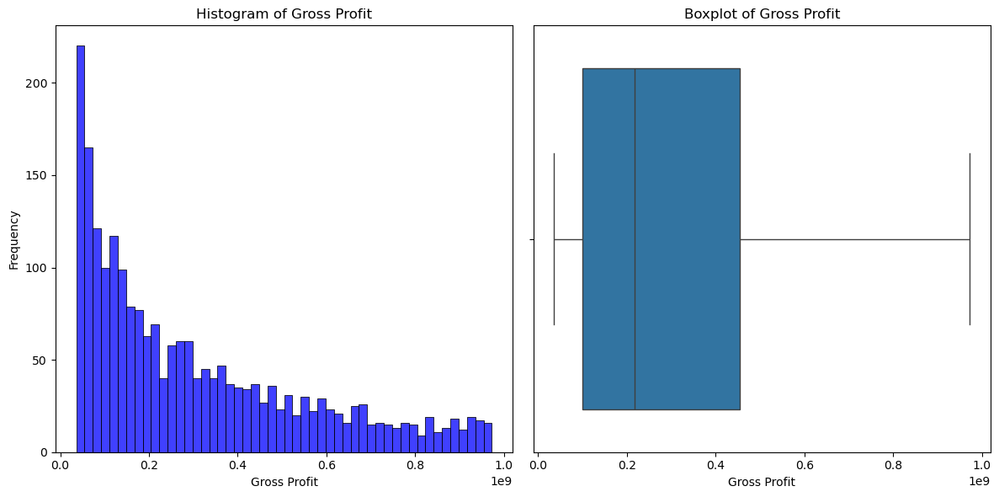

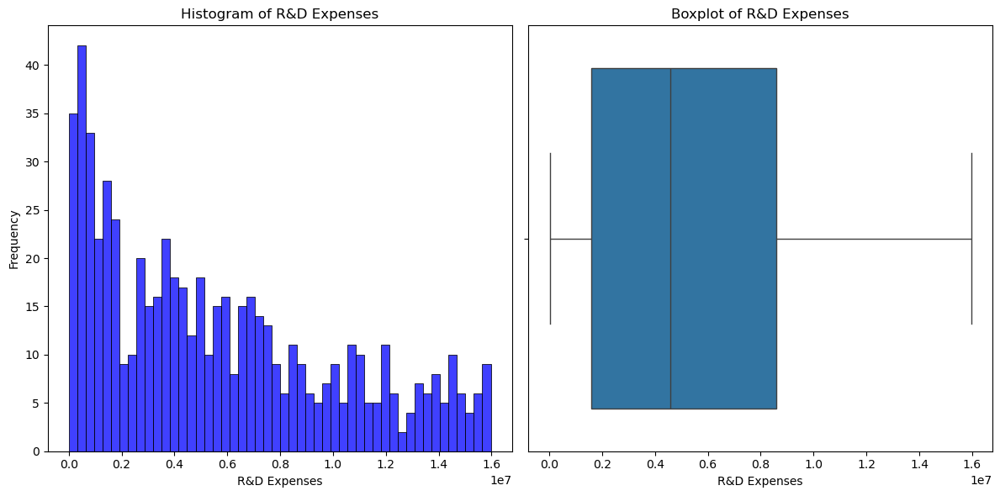

...

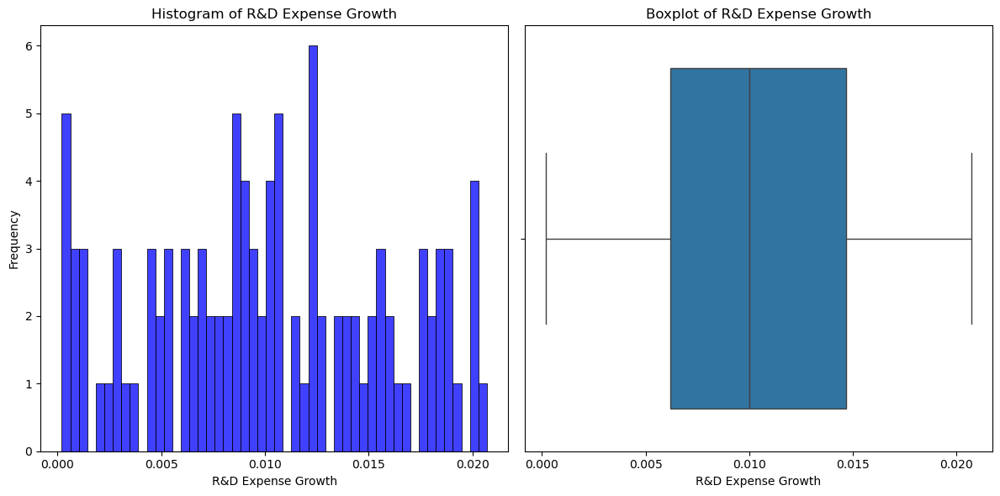

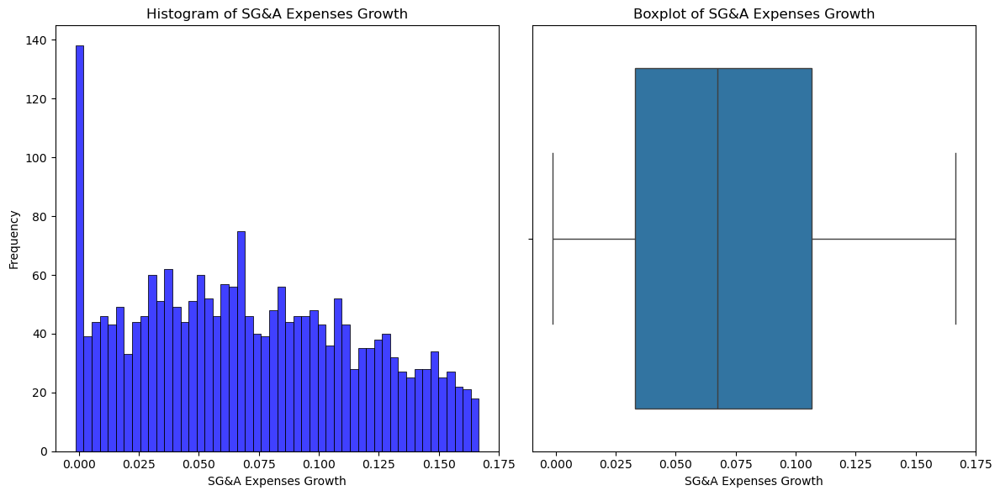

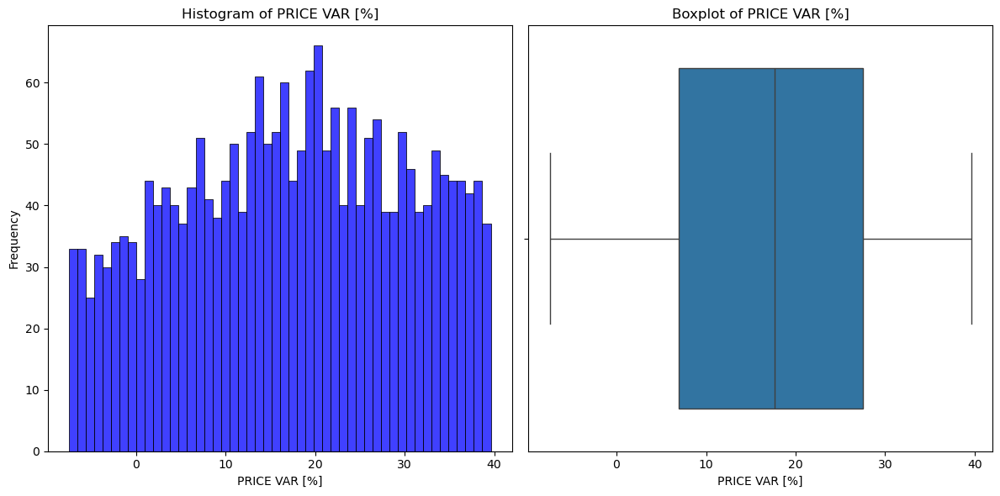

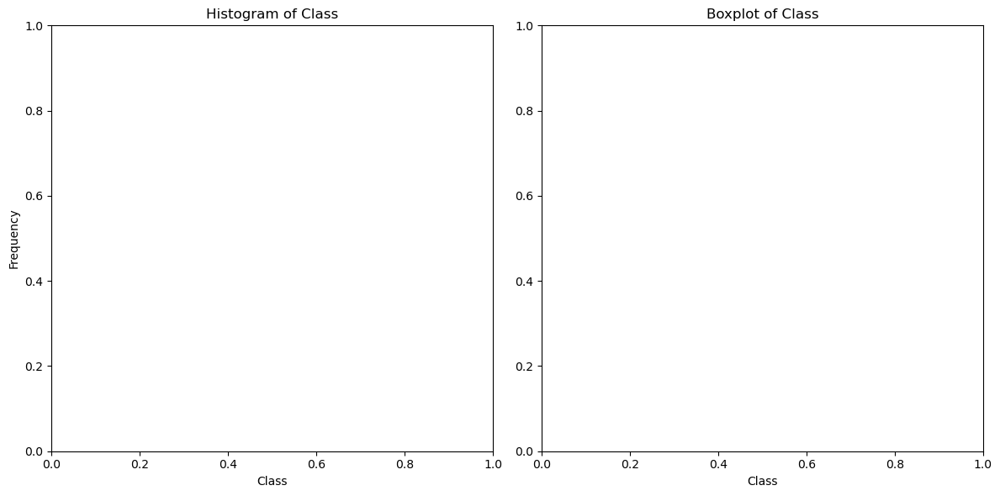

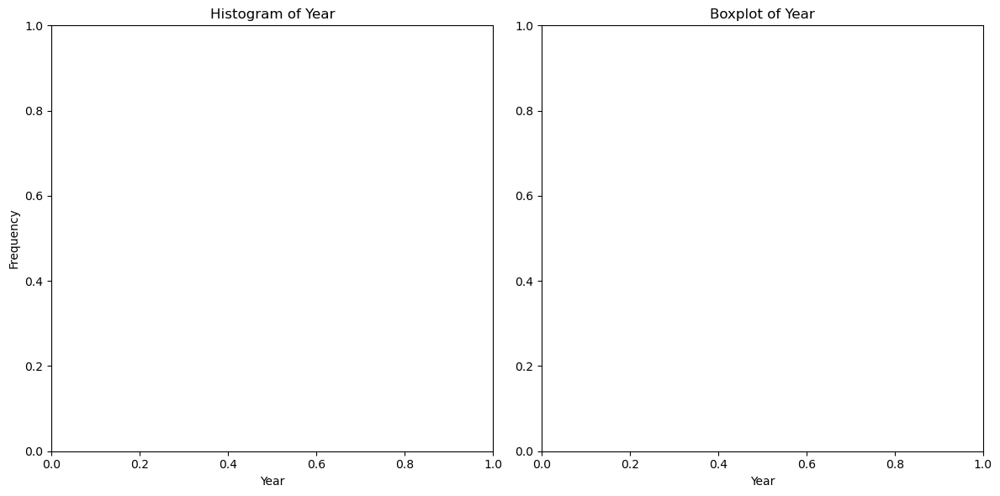

In [9]:
plot_financial_data(full_df['2018'])

### Skewness and Outliers in Financial Data

Upon analyzing the distribution of features, it is evident that **most features are highly skewed**, which is common in financial datasets. Financial data often exhibits skewness due to the nature of company performance, market behavior, and other external factors. 

In addition, we observed **significant outliers** across multiple features. These outliers might not necessarily be errors but could represent genuine extreme values common in financial data, such as periods of rapid growth, sharp declines or size of companies.

For **visualization purposes**, I decided to cap the upper and lower bounds at **0.25 quantiles**. This allows us to focus on the majority of the data and better understand its behavior without the extreme values skewing our interpretation.

However, outlier handling is crucial for model performance, so we will generate multiple versions of the dataset with different levels of outlier capping:

- **0.1 quantile capping**
- **0.15 quantile capping**
- **0.2 quantile capping**
- **0.25 quantile capping (current visualization)**

These datasets will be used later to train the model, and we will analyze whether varying the outlier capping has any significant impact on model performance. This approach will help us strike the right balance between capturing extreme financial behaviors and ensuring the model remains robust and interpretable.


## 3. Correlation Analysis

In this step, we will explore the relationships between different numerical features by calculating their pairwise correlations. Correlation analysis helps identify features that are strongly related, either positively or negatively, which can guide feature selection and engineering in later stages of the modeling process.

We will primarily focus on:

- **Positive Correlations**: Features that increase together (values close to +1).
- **Negative Correlations**: Features where one increases as the other decreases (values close to -1).
- **Weak or No Correlation**: Features that have little to no linear relationship (values close to 0).

Highly correlated features can introduce multicollinearity, which can impact model performance. By identifying these relationships, we can decide whether to drop certain features or combine them in a meaningful way. 

We will use **heatmaps** to visualize these correlations, allowing us to easily identify strong relationships in the data. Additionally, we will look for groups of features that are related and may carry redundant information, which we can handle before model training.


In [10]:
 profit_features = [
        'Revenue', 'Gross Profit', 'Operating Income', 'Net Income',
        'Total assets', 'Total liabilities', 'EBITDA', 'EPS'
    ]

def plot_simplified_correlation_heatmap(df, features_of_interest):

    # Get the first year value from the 'year_column_name'
    year = df['Year'].iloc[0]

    # Calculate correlation matrix for the selected columns
    correlation_matrix = df[features_of_interest].corr()

    # Plotting the heatmap
    plt.figure(figsize=(10, 8))  # Larger figure size
    sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt=".2f")
    plt.title(f'Correlation Heatmap for the Year {year}')
    plt.show()

In [11]:
# Year 2014
# Choose features by hand
profit_features = [
        'Revenue', 'Gross Profit', 'Operating Income', 'Net Income',
        'Total assets', 'Total liabilities', 'EBITDA', 'EPS'
    ]
# Chosse features randomly
numeric_columns = df.select_dtypes(include='number').columns
random_features = random.sample(list(df.columns), 20)

plot_simplified_correlation_heatmap(full_df['2014'], random_features)

NameError: name 'random' is not defined

### Correlation Heatmap Analysis for 2014

#### Key Observations:

1. **Strong Correlations**:
   - **Enterprise Value vs. Property, Plant & Equipment Net** (~0.80): Companies with higher asset values tend to have higher enterprise values.
   - **Price to Book Ratio vs. Net Income** (~0.99): Profitable companies have higher market valuations relative to their book value.
   - **Return on Equity vs. Net Income** (~0.98): ROE is strongly tied to net income, as expected.

2. **Moderate Correlations**:
   - **Free Cash Flow Growth vs. Inventory Growth** (~0.58): Growing inventories often coincide with increased cash flow.
   - **R&D Expenses vs. Other Liabilities** (~0.55): Companies investing in R&D tend to take on more liabilities.
   - **EV to Sales vs. Debt Ratio** (~0.58): Higher debt ratios are associated with higher EV to Sales, indicating investor expectations of growth.

3. **Weak Correlations**:
   - **Net Income Growth**: Shows weak correlations with most variables, suggesting complex interactions.
   - **Inventory Growth**: Correlates weakly with other variables, except Free Cash Flow Growth.

4. **Uncorrelated/Negative Correlations**:
   - **Operating Cash Flow vs. Enterprise Value** (-0.30): High enterprise value does not strongly correlate with operating cash flow.
   - **Debt Ratio vs. Free Cash Flow Growth** (~0.06): Leverage does not strongly affect free cash flow growth.

#### Summary:
- **Profitability vs. Valuation**: High profitability correlates with higher market valuations.
- **Growth vs. Cash Flow**: Growing inventories can drive cash flow.
- **Leverage and Value**: Higher leverage (debt ratio) correlates with higher enterprise value.

The heatmap highlights strong connections between profitability and valuation metrics, while leverage shows a moderate link to enterprise value. 
Note: We have almost 200 features it is not possible to see all the correlations between all them without it being confusing

## 4. Outlier Detection

In this step, we will identify and analyze **outliers** in the dataset. Outliers are data points that deviate significantly from the rest of the observations. While some outliers might be the result of errors or anomalies, others may represent important financial events, such as extreme profits or losses.

Outlier detection is essential because these points can disproportionately influence model performance, especially in financial data. Outliers can:
- **Skew Model Predictions**: They can cause models to place undue emphasis on rare cases, leading to biased predictions.
- **Increase Variance**: Outliers can lead to increased variance in the model, making it less robust to new data.

#### Detection Methods:
- **IQR (Interquartile Range)**: Using IQR, we will identify outliers as points falling below Q1 - 2 * IQR or above Q3 + 2 * IQR.

### Strategy for Handling Outliers:
Some outliers might be retained, especially if they provide valuable information about market behavior. However, we will also create datasets where outliers are capped at different thresholds (e.g., 0.1, 0.15, 0.2 quantiles) to see how the model performs with and without these extreme values. This approach will help ensure that we strike the right balance between preserving meaningful outliers and minimizing their negative impact on model accuracy.


In [ ]:
import os

# Function to cap outliers using IQR
def cap_outliers(df, outlier_cap):
    df_capped = df.copy()
    numeric_cols = df_capped.select_dtypes(include=[np.number]).columns
    
    for column in numeric_cols:
        Q1 = df_capped[column].quantile(outlier_cap)
        Q3 = df_capped[column].quantile(1 - outlier_cap)
        IQR = Q3 - Q1
        lower_bound = Q1 - 2 * IQR
        upper_bound = Q3 + 2 * IQR
        
        # Cap the outliers
        df_capped[column] = np.where(df_capped[column] < lower_bound, lower_bound, df_capped[column])
        df_capped[column] = np.where(df_capped[column] > upper_bound, upper_bound, df_capped[column])
    
    return df_capped

# Directory to save the files
output_dir = 'data/outliers_data/'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# List of outlier caps to apply
outlier_caps = [0.1, 0.15, 0.2]

# Apply the IQR capping for each dataset and each outlier cap
for year, df in full_df.items():
    for cap in outlier_caps:
        df_capped = cap_outliers(df, cap)
        output_path = f"{output_dir}{year}_{int(cap*100)}_Capped_outliers.csv"
        df_capped.to_csv(output_path, index=False)
        print(f"Saved capped dataset for {year} with {cap} quantile to {output_path}")


## 5. Next Steps: PCA and Clustering

With the Exploratory Data Analysis (EDA) complete, we will move on to **Feature Engineering** in the next notebook. In this phase, we will create new features, transform existing ones, and prepare the data for model training. Feature engineering is a crucial step in improving model accuracy and ensuring that we extract the most useful information from the dataset.

The key tasks in this notebook will include:

1. **Principal Component Analysis (PCA)**:
   - We will use PCA to reduce the dimensionality of our dataset while preserving the most important information. This will help us address any multicollinearity issues and reduce the complexity of the data, making the model more efficient.

2. **Clustering**:
   - We will apply clustering techniques (e.g., K-Means or hierarchical clustering) to group stocks with similar characteristics. This could help in identifying hidden patterns and relationships between stocks, as well as creating additional features that capture group-level behaviors.


Feature engineering is a vital step toward building an effective machine learning model that can consistently identify stocks capable of outperforming the market.
